# Data Science & AI Engineering - Klasifikasi Penyakit Daun Tomat
**Projek Capstone: Optimasi Pipeline Model Deteksi Penyakit Tanaman Pangan**

Notebook ini menggabungkan tahapan **Data Science (Eksplorasi & Preprocessing)** dan **AI Engineering (Pemodelan & Evaluasi)** ke dalam satu pipeline end-to-end yang solid dan efisien.

## 0. Setup & Konfigurasi Path

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

BASE_DIR = '/content/drive/MyDrive/plant_disease_project'
import os
for d in ['raw', 'models', 'logs', 'reports/eda', 'reports/figures']:
    os.makedirs(f'{BASE_DIR}/{d}', exist_ok=True)
print(f'BASE_DIR: {BASE_DIR}')

Mounted at /content/drive
BASE_DIR: /content/drive/MyDrive/plant_disease_project


In [2]:
!pip install -q tensorflow scikit-learn seaborn matplotlib pandas plotly Pillow tabulate kaggle

import tensorflow as tf, numpy as np, pandas as pd, json, os, shutil, random, warnings, time
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt, seaborn as sns
from sklearn import metrics as skm
from tensorflow.keras.applications.efficientnet import preprocess_input

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

IMG_SIZE = (224, 224)
BATCH = 32
AUTOTUNE = tf.data.AUTOTUNE
NUM_CLASSES = 4
IMG_EXTS = {'.jpg', '.jpeg', '.png'}

PV_DIR = f'{BASE_DIR}/raw/plantvillage'
FILTERED_DIR = f'{BASE_DIR}/raw/filtered'
LOCAL_PROC_DIR = '/content/processed'
ZIP_PATH = f'{BASE_DIR}/processed.zip'

LABEL_MAP = {
    'bacterial_spot': 'Tomato Bacterial Spot',
    'early_blight':   'Tomato Early Blight',
    'healthy':        'Tomato Healthy',
    'late_blight':    'Tomato Late Blight'
}

print('✓ Dependencies & Configurations ready')
print(f'TensorFlow Version: {tf.__version__}')
print(f'GPU Available: {len(tf.config.list_physical_devices("GPU")) > 0}')

✓ Dependencies & Configurations ready
TensorFlow Version: 2.20.0
GPU Available: True


## 1. Business Question

**Scope Projek:** Projek ini ditujukan untuk **orang awam yang baru belajar berkebun di rumah**.
Fokus utama aplikasi ini adalah membantu pemula mengenali gejala penyakit pada berbagai **tanaman pangan yang umum ditanam di pekarangan rumah**, seperti tomat, cabai, terong, bayam, kangkung, sawi, dan daun bawang.

Untuk tahap awal ini, tim kami menggunakan **tomat sebagai contoh kasus (pilot plant)** karena tomat sangat populer ditanam namun rentan terhadap berbagai penyakit. Alat bantu berbasis AI ini dirancang agar mudah digunakan oleh siapa saja, tanpa memerlukan pengetahuan agronomi mendalam, sehingga mereka dapat mendeteksi penyakit sejak dini dan mengambil tindakan perawatan yang tepat.

**Masalah:** Berkebun di rumah semakin populer untuk mendukung ketahanan pangan keluarga, namun pemula sering kesulitan mendeteksi penyakit tanaman secara cepat dan akurat. Keterlambatan identifikasi dapat menyebabkan tanaman mati, gagal panen, dan menurunkan minat berkebun. Berbeda dengan petani profesional, orang awam umumnya tidak memiliki akses langsung ke penyuluh atau tenaga ahli pertanian.

**Tujuan:** Membangun model deep learning yang mudah diakses dan mampu mengklasifikasikan 4 kondisi daun tomat (sebagai model awal dari ekosistem tanaman pangan pekarangan), sehingga pekebun rumahan pemula dapat dengan cepat mengetahui kondisi tanamannya:
1. **Healthy** — Daun sehat (tidak perlu tindakan khusus)
2. **Bacterial Spot** — Bercak bakteri (perlu penanganan segera)
3. **Early Blight** — Hawar awal / Alternaria solani (perlu penanganan segera)
4. **Late Blight** — Hawar akhir / Phytophthora infestans (perlu penanganan segera)

**Metrik Sukses:**
- Akurasi model ≥ **85%** pada test set
- F1-Score ≥ **0.80** per kelas
- Waktu inferensi < 2 detik per gambar


## 2. Data Wrangling
### 2.1 Gathering
Download dataset PlantVillage dari Kaggle dan filter hanya 4 kelas tomat.


In [3]:
# Setup Kaggle Access Token
import os

kaggle_dir = os.path.expanduser('~/.kaggle')
token_path = os.path.join(kaggle_dir, 'access_token')

if not os.path.exists(token_path):
    os.makedirs(kaggle_dir, exist_ok=True)
    # Paste token dari Kaggle -> Settings -> API -> Create New Token
    KAGGLE_TOKEN = 'KGAT_0a715ba25ee5502b632f623a8646c57a'
    with open(token_path, 'w') as f:
        f.write(KAGGLE_TOKEN)
    os.chmod(token_path, 0o600)
    print('Access token saved')
else:
    print('Access token sudah ada')


Access token saved


In [4]:
RAW_DIR = f'{BASE_DIR}/raw'
PV_DIR = f'{RAW_DIR}/PlantVillage'

# Check if dataset already exists and has files
dataset_exists = False
if os.path.exists(PV_DIR):
    all_dirs = [d for d in os.listdir(PV_DIR) if os.path.isdir(os.path.join(PV_DIR, d))]
    if len(all_dirs) > 0:
        dataset_exists = True

if not dataset_exists:
    print('Downloading PlantVillage dataset using kagglehub...')
    import kagglehub
    try:
        # kagglehub will automatically read from ~/.kaggle/access_token
        downloaded_path = kagglehub.dataset_download('emmarex/plantdisease')
        print(f'Download selesai. Path: {downloaded_path}')

        # Cari folder plantvillage di downloaded_path
        pv_source = None
        for root, dirs, files in os.walk(downloaded_path):
            if any('tomato' in d.lower() for d in dirs):
                pv_source = root
                break

        if pv_source:
            if os.path.exists(PV_DIR):
                shutil.rmtree(PV_DIR)
            shutil.copytree(pv_source, PV_DIR)
            print(f'✓ PlantVillage dataset disalin ke {PV_DIR}')
        else:
            print('ERROR: Tidak bisa menemukan folder dataset di downloaded path')
    except Exception as e:
        print(f'ERROR saat mendownload PlantVillage via kagglehub: {e}')
        print('Mencoba download menggunakan legacy CLI...')
        !kaggle datasets download -d emmarex/plantdisease -p {RAW_DIR} --unzip -q
        print('✓ Legacy CLI download selesai')
else:
    print('Dataset PlantVillage sudah ada.')

# Scan folder untuk verifikasi
all_folders = [d for d in os.listdir(PV_DIR) if os.path.isdir(os.path.join(PV_DIR, d))]
print(f'Semua folder ditemukan ({len(all_folders)}):')
for f in sorted(all_folders):
    count = len(os.listdir(os.path.join(PV_DIR, f)))
    print(f'  {f}: {count} files')


Dataset PlantVillage sudah ada.
Semua folder ditemukan (15):
  Pepper__bell___Bacterial_spot: 997 files
  Pepper__bell___healthy: 1478 files
  Potato___Early_blight: 1000 files
  Potato___Late_blight: 1000 files
  Potato___healthy: 152 files
  Tomato_Bacterial_spot: 2127 files
  Tomato_Early_blight: 1000 files
  Tomato_Late_blight: 1909 files
  Tomato_Leaf_Mold: 952 files
  Tomato_Septoria_leaf_spot: 1771 files
  Tomato_Spider_mites_Two_spotted_spider_mite: 1676 files
  Tomato__Target_Spot: 1404 files
  Tomato__Tomato_YellowLeaf__Curl_Virus: 3209 files
  Tomato__Tomato_mosaic_virus: 373 files
  Tomato_healthy: 1591 files


In [5]:
# Filter hanya 4 kelas tomat yang dibutuhkan
# Nama folder di PlantVillage bisa bervariasi (underscore ganda, dll)
# Jadi kita pakai fuzzy matching

KEYWORDS_MAP = {
    'bacterial_spot': ['bacterial_spot', 'bacterial spot'],
    'early_blight':   ['early_blight', 'early blight'],
    'late_blight':    ['late_blight', 'late blight'],
    'healthy':        ['healthy'],
}

# Scan semua folder yang ada
all_folders = [d for d in os.listdir(PV_DIR) if os.path.isdir(os.path.join(PV_DIR, d))]
print(f'Semua folder ditemukan ({len(all_folders)}):')
for f in sorted(all_folders):
    count = len(os.listdir(os.path.join(PV_DIR, f)))
    print(f'  {f}: {count} files')

# Match folder ke target kelas
FILTERED_DIR = f'{BASE_DIR}/raw/filtered'
if os.path.exists(FILTERED_DIR):
    shutil.rmtree(FILTERED_DIR)
os.makedirs(FILTERED_DIR, exist_ok=True)

matched = {}
for target_name, keywords in KEYWORDS_MAP.items():
    for folder in all_folders:
        folder_lower = folder.lower().replace('_', ' ').replace('-', ' ')
        if any(kw in folder_lower for kw in keywords) and 'tomato' in folder_lower:
            matched[target_name] = folder
            break
    # Jika tidak match dengan 'tomato' prefix, coba tanpa
    if target_name not in matched:
        for folder in all_folders:
            folder_lower = folder.lower().replace('_', ' ').replace('-', ' ')
            if any(kw in folder_lower for kw in keywords):
                matched[target_name] = folder
                break

print(f'\nMatched folders:')
for target, src_folder in matched.items():
    src = os.path.join(PV_DIR, src_folder)
    dst = os.path.join(FILTERED_DIR, target)
    shutil.copytree(src, dst)
    count = len([f for f in os.listdir(dst) if f.lower().endswith(('.jpg','.jpeg','.png'))])
    print(f'  {target} <- {src_folder}: {count} gambar')

# Cek jika ada yang tidak match
missing = set(KEYWORDS_MAP.keys()) - set(matched.keys())
if missing:
    print(f'\nWARNING: Kelas tidak ditemukan: {missing}')
    print('Silakan cek nama folder di atas dan sesuaikan KEYWORDS_MAP')
else:
    print(f'\n4 kelas berhasil difilter')


Semua folder ditemukan (15):
  Pepper__bell___Bacterial_spot: 997 files
  Pepper__bell___healthy: 1478 files
  Potato___Early_blight: 1000 files
  Potato___Late_blight: 1000 files
  Potato___healthy: 152 files
  Tomato_Bacterial_spot: 2127 files
  Tomato_Early_blight: 1000 files
  Tomato_Late_blight: 1909 files
  Tomato_Leaf_Mold: 952 files
  Tomato_Septoria_leaf_spot: 1771 files
  Tomato_Spider_mites_Two_spotted_spider_mite: 1676 files
  Tomato__Target_Spot: 1404 files
  Tomato__Tomato_YellowLeaf__Curl_Virus: 3209 files
  Tomato__Tomato_mosaic_virus: 373 files
  Tomato_healthy: 1591 files

Matched folders:
  bacterial_spot <- Tomato_Bacterial_spot: 2127 gambar
  early_blight <- Tomato_Early_blight: 1000 gambar
  late_blight <- Tomato_Late_blight: 1909 gambar
  healthy <- Tomato_healthy: 1591 gambar

4 kelas berhasil difilter


In [6]:
# FIX: Tomato_healthy di emmarex/plantdisease kosong (0 file)
# Download healthy tomato dari dataset alternatif
healthy_dir = f'{FILTERED_DIR}/healthy'
healthy_count = len([f for f in os.listdir(healthy_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))]) if os.path.exists(healthy_dir) else 0

if healthy_count == 0:
    print('Tomato_healthy kosong! Downloading dari dataset alternatif menggunakan kagglehub...')
    import kagglehub
    try:
        # kagglehub akan membaca token secara otomatis dari ~/.kaggle/access_token
        downloaded_path = kagglehub.dataset_download('kaustubhb999/tomatoleaf')
        print(f'Download selesai. Path: {downloaded_path}')

        # Cari folder healthy di dataset alternatif
        alt_healthy = None
        for root, dirs, files in os.walk(downloaded_path):
            for d in dirs:
                if 'healthy' in d.lower() and 'tomato' in d.lower():
                    candidate = os.path.join(root, d)
                    img_count = len([f for f in os.listdir(candidate) if f.lower().endswith(('.jpg','.jpeg','.png'))])
                    if img_count > 0:
                        alt_healthy = candidate
                        print(f'Found: {candidate} ({img_count} images)')
                        break
            if alt_healthy:
                break

        if alt_healthy:
            if os.path.exists(healthy_dir):
                shutil.rmtree(healthy_dir)
            shutil.copytree(alt_healthy, healthy_dir)
            new_count = len([f for f in os.listdir(healthy_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
            print(f'Healthy: {new_count} gambar (dari kaustubhb999/tomatoleaf)')
        else:
            print('ERROR: Tidak bisa menemukan folder healthy tomato di dataset alternatif')
    except Exception as e:
        print(f'ERROR saat mendownload dari kagglehub: {e}')
        print('Mencoba download menggunakan legacy CLI...')
        ALT_DIR = f'{BASE_DIR}/raw/alt_tomato'
        !kaggle datasets download -d kaustubhb999/tomatoleaf -p {ALT_DIR} --unzip -q
        print('Download selesai')

        # Cari folder healthy di dataset alternatif
        alt_healthy = None
        for root, dirs, files in os.walk(ALT_DIR):
            for d in dirs:
                if 'healthy' in d.lower() and 'tomato' in d.lower():
                    candidate = os.path.join(root, d)
                    img_count = len([f for f in os.listdir(candidate) if f.lower().endswith(('.jpg','.jpeg','.png'))])
                    if img_count > 0:
                        alt_healthy = candidate
                        print(f'Found: {candidate} ({img_count} images)')
                        break
            if alt_healthy:
                break

        if alt_healthy:
            if os.path.exists(healthy_dir):
                shutil.rmtree(healthy_dir)
            shutil.copytree(alt_healthy, healthy_dir)
            new_count = len([f for f in os.listdir(healthy_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
            print(f'Healthy: {new_count} gambar (dari kaustubhb999/tomatoleaf)')
        else:
            print('ERROR: Tidak bisa menemukan folder healthy tomato di dataset alternatif')
else:
    print(f'Healthy sudah ada: {healthy_count} gambar')

# Verifikasi semua kelas
print('\nVerifikasi akhir:')
for cls in sorted(os.listdir(FILTERED_DIR)):
    cls_dir = os.path.join(FILTERED_DIR, cls)
    if os.path.isdir(cls_dir):
        count = len([f for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
        status = 'OK' if count > 0 else 'EMPTY!'
        print(f'  {cls}: {count} gambar [{status}]')


Healthy sudah ada: 1591 gambar

Verifikasi akhir:
  bacterial_spot: 2127 gambar [OK]
  early_blight: 1000 gambar [OK]
  healthy: 1591 gambar [OK]
  late_blight: 1909 gambar [OK]


### 2.2 Assessing
Memeriksa kualitas data: gambar corrupt, format, ukuran, dan distribusi.


In [7]:
IMG_EXTS = {'.jpg', '.jpeg', '.png'}
all_info = []
corrupt_files = []

for cls_name in sorted(os.listdir(FILTERED_DIR)):
    cls_dir = os.path.join(FILTERED_DIR, cls_name)
    if not os.path.isdir(cls_dir): continue
    for fname in os.listdir(cls_dir):
        fpath = os.path.join(cls_dir, fname)
        ext = os.path.splitext(fname)[1].lower()
        if ext not in IMG_EXTS: continue
        try:
            img = Image.open(fpath)
            img.verify()
            img = Image.open(fpath)  # re-open after verify
            w, h = img.size
            all_info.append({'class': cls_name, 'file': fname, 'width': w, 'height': h,
                             'format': img.format, 'mode': img.mode, 'path': fpath})
        except Exception as e:
            corrupt_files.append({'class': cls_name, 'file': fname, 'error': str(e)})

df_info = pd.DataFrame(all_info)
print(f'Total gambar valid: {len(df_info)}')
print(f'Gambar corrupt: {len(corrupt_files)}')
print(f'\nDistribusi per kelas:')
print(df_info['class'].value_counts().to_string())
print(f'\nUkuran gambar:')
print(df_info[['width','height']].describe().to_string())
print(f'\nFormat: {df_info["format"].value_counts().to_dict()}')
print(f'Mode: {df_info["mode"].value_counts().to_dict()}')

if corrupt_files:
    print(f'\n⚠️ Corrupt files:')
    for cf in corrupt_files:
        print(f'  {cf["class"]}/{cf["file"]}: {cf["error"]}')


Total gambar valid: 6627
Gambar corrupt: 0

Distribusi per kelas:
class
bacterial_spot    2127
late_blight       1909
healthy           1591
early_blight      1000

Ukuran gambar:
        width  height
count  6627.0  6627.0
mean    256.0   256.0
std       0.0     0.0
min     256.0   256.0
25%     256.0   256.0
50%     256.0   256.0
75%     256.0   256.0
max     256.0   256.0

Format: {'JPEG': 6627}
Mode: {'RGB': 6627}


### 2.3 Cleaning
Hapus gambar corrupt dan pastikan semua gambar valid.


In [8]:
# Hapus file corrupt
for cf in corrupt_files:
    fpath = os.path.join(FILTERED_DIR, cf['class'], cf['file'])
    if os.path.exists(fpath):
        os.remove(fpath)
        print(f'  Deleted: {cf["class"]}/{cf["file"]}')

if not corrupt_files:
    print('✓ Tidak ada gambar corrupt, data sudah bersih')
else:
    print(f'✓ {len(corrupt_files)} gambar corrupt dihapus')

# Verifikasi ulang
for cls_name in sorted(os.listdir(FILTERED_DIR)):
    cls_dir = os.path.join(FILTERED_DIR, cls_name)
    if not os.path.isdir(cls_dir): continue
    count = len([f for f in os.listdir(cls_dir) if os.path.splitext(f)[1].lower() in IMG_EXTS])
    print(f'  {cls_name}: {count} gambar')


✓ Tidak ada gambar corrupt, data sudah bersih
  bacterial_spot: 2127 gambar
  early_blight: 1000 gambar
  healthy: 1591 gambar
  late_blight: 1909 gambar


In [9]:
# === Verifikasi FILTERED_DIR sebelum splitting ===
TARGET_CLASSES = ['bacterial_spot', 'early_blight', 'healthy', 'late_blight']

print('=== Isi FILTERED_DIR ===')
print(f'Path: {FILTERED_DIR}')

for cls in TARGET_CLASSES:
    cls_dir = os.path.join(FILTERED_DIR, cls)
    if os.path.isdir(cls_dir):
        count = len([f for f in os.listdir(cls_dir) if os.path.splitext(f)[1].lower() in IMG_EXTS])
        print(f'  {cls}: {count} gambar')
        if count == 0:
            raise ValueError(f'Kelas {cls} ada tapi kosong! Jalankan ulang cell filtering (Section 2.1) dari awal.')
    else:
        raise ValueError(f'Kelas {cls} TIDAK DITEMUKAN di {FILTERED_DIR}! Jalankan ulang cell filtering (Section 2.1) dari awal.')

print('\n✓ FILTERED_DIR lengkap, siap untuk splitting')


=== Isi FILTERED_DIR ===
Path: /content/drive/MyDrive/plant_disease_project/raw/filtered
  bacterial_spot: 2127 gambar
  early_blight: 1000 gambar
  healthy: 1591 gambar
  late_blight: 1909 gambar

✓ FILTERED_DIR lengkap, siap untuk splitting


### 2.4 Data Splitting & Local VM Storage

Untuk mencegah isu sinkronisasi Google Drive (delay/file hilang ketika menyalin ribuan file kecil), proses splitting dilakukan pada **lokal Colab VM SSD** (`/content/processed`). Setelah selesai, folder tersebut dikompresi menjadi satu file zip (`processed.zip`) lalu disalin ke Google Drive.

In [10]:
import hashlib
import time

def get_file_hash(filepath):
    with open(filepath, 'rb') as f:
        return hashlib.md5(f.read()).hexdigest()

# Bersihkan split lama di lokal
if os.path.exists(LOCAL_PROC_DIR):
    shutil.rmtree(LOCAL_PROC_DIR)
os.makedirs(LOCAL_PROC_DIR, exist_ok=True)

for split in ['train','val','test']:
    os.makedirs(f'{LOCAL_PROC_DIR}/{split}', exist_ok=True)

split_stats = {}
for cls_name in sorted(os.listdir(FILTERED_DIR)):
    cls_dir = os.path.join(FILTERED_DIR, cls_name)
    if not os.path.isdir(cls_dir): continue

    # Filter duplicate images based on MD5 hash (Data Leakage Prevention)
    all_files = [f for f in os.listdir(cls_dir) if os.path.splitext(f)[1].lower() in IMG_EXTS]
    unique_files = []
    seen_hashes = set()
    for f in all_files:
        fpath = os.path.join(cls_dir, f)
        h = get_file_hash(fpath)
        if h not in seen_hashes:
            seen_hashes.add(h)
            unique_files.append(f)

    files = unique_files
    random.shuffle(files)
    n = len(files)
    n_train = int(n * 0.70)
    n_val = int(n * 0.15)

    splits = {
        'train': files[:n_train],
        'val':   files[n_train:n_train+n_val],
        'test':  files[n_train+n_val:]
    }

    for split_name, split_files in splits.items():
        dst_dir = f'{LOCAL_PROC_DIR}/{split_name}/{cls_name}'
        os.makedirs(dst_dir, exist_ok=True)
        for f in split_files:
            shutil.copy2(os.path.join(cls_dir, f), os.path.join(dst_dir, f))

    split_stats[cls_name] = {k: len(v) for k, v in splits.items()}
    print(f'{cls_name}: train={len(splits["train"])}, val={len(splits["val"])}, test={len(splits["test"])} (dari {len(all_files)} total, {len(all_files)-n} duplikat dihapus)')

# Verifikasi hasil split lokal
print('\n=== Verifikasi Split Lokal ===')
all_ok = True
for split in ['train', 'val', 'test']:
    for cls in TARGET_CLASSES:
        path = f'{LOCAL_PROC_DIR}/{split}/{cls}'
        if os.path.isdir(path):
            count = len([f for f in os.listdir(path) if os.path.splitext(f)[1].lower() in IMG_EXTS])
            status = f'{count} gambar' if count > 0 else 'KOSONG!'
            if count == 0: all_ok = False
            print(f'  {split}/{cls}: {status}')
        else:
            print(f'  {split}/{cls}: TIDAK DITEMUKAN!')
            all_ok = False

if all_ok:
    print('\n✓ Data splitting lokal selesai dan terverifikasi')

    # Kompresi folder ke zip
    print('\nMengompresi dataset ke zip untuk disimpan di Google Drive...')
    if os.path.exists('/content/processed.zip'):
        os.remove('/content/processed.zip')
    shutil.make_archive('/content/processed', 'zip', LOCAL_PROC_DIR)

    print(f'Menyalin zip ke Google Drive -> {ZIP_PATH}...')
    shutil.copy2('/content/processed.zip', ZIP_PATH)
    print('✓ Dataset zip berhasil disimpan di Google Drive!')
else:
    print('\n⚠️ Ada masalah dalam splitting data!')

bacterial_spot: train=1488, val=319, test=320 (dari 2127 total, 0 duplikat dihapus)
early_blight: train=700, val=150, test=150 (dari 1000 total, 0 duplikat dihapus)
healthy: train=1109, val=237, test=239 (dari 1591 total, 6 duplikat dihapus)
late_blight: train=1330, val=285, test=286 (dari 1909 total, 8 duplikat dihapus)

=== Verifikasi Split Lokal ===
  train/bacterial_spot: 1488 gambar
  train/early_blight: 700 gambar
  train/healthy: 1109 gambar
  train/late_blight: 1330 gambar
  val/bacterial_spot: 319 gambar
  val/early_blight: 150 gambar
  val/healthy: 237 gambar
  val/late_blight: 285 gambar
  test/bacterial_spot: 320 gambar
  test/early_blight: 150 gambar
  test/healthy: 239 gambar
  test/late_blight: 286 gambar

✓ Data splitting lokal selesai dan terverifikasi

Mengompresi dataset ke zip untuk disimpan di Google Drive...
Menyalin zip ke Google Drive -> /content/drive/MyDrive/plant_disease_project/processed.zip...
✓ Dataset zip berhasil disimpan di Google Drive!


In [11]:
# ========================================
# Verifikasi: Cek duplikat antar split lokal
# ========================================
all_hashes = {}
duplicates_found = False
for split in ['train', 'val', 'test']:
    split_dir = f'{LOCAL_PROC_DIR}/{split}'
    for cls_name in sorted(os.listdir(split_dir)):
        cls_dir = os.path.join(split_dir, cls_name)
        if not os.path.isdir(cls_dir): continue
        for fname in os.listdir(cls_dir):
            fpath = os.path.join(cls_dir, fname)
            h = get_file_hash(fpath)
            if h in all_hashes:
                print(f'⚠️ DUPLICATE: {split}/{cls_name}/{fname} == {all_hashes[h]}')
                duplicates_found = True
            else:
                all_hashes[h] = f'{split}/{cls_name}/{fname}'

if not duplicates_found:
    print('✓ Bebas kebocoran data! Tidak ada duplikat gambar antar split (train/val/test).')
else:
    print('⚠️ PERINGATAN: Ditemukan duplikat! Ini bisa menyebabkan data leakage.')

✓ Bebas kebocoran data! Tidak ada duplikat gambar antar split (train/val/test).


## 3. Exploratory Data Analysis (EDA)
### 3.1 Distribusi Kelas


                train  val  test  total
Bacterial Spot   1488  319   320   2127
Early Blight      700  150   150   1000
Healthy          1109  237   239   1585
Late Blight      1330  285   286   1901


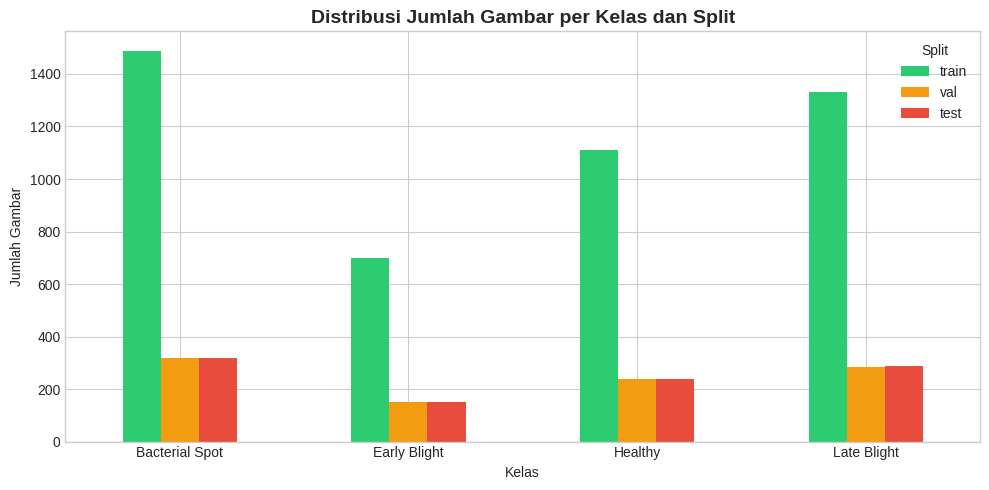

In [12]:
CLASS_NAMES = sorted(os.listdir(f'{LOCAL_PROC_DIR}/train'))
CLASS_LABELS = {'bacterial_spot':'Bacterial Spot','early_blight':'Early Blight',
                'healthy':'Healthy','late_blight':'Late Blight'}

# Hitung per split
counts = {}
for split in ['train','val','test']:
    counts[split] = {}
    for cls in CLASS_NAMES:
        d = f'{LOCAL_PROC_DIR}/{split}/{cls}'
        counts[split][cls] = len(os.listdir(d)) if os.path.exists(d) else 0

df_counts = pd.DataFrame(counts)
df_counts['total'] = df_counts.sum(axis=1)
df_counts.index = [CLASS_LABELS.get(c,c) for c in df_counts.index]
print(df_counts.to_string())

# Bar chart
fig, ax = plt.subplots(figsize=(10, 5))
df_counts[['train','val','test']].plot(kind='bar', ax=ax, color=['#2ecc71','#f39c12','#e74c3c'])
ax.set_title('Distribusi Jumlah Gambar per Kelas dan Split', fontsize=14, fontweight='bold')
ax.set_xlabel('Kelas')
ax.set_ylabel('Jumlah Gambar')
ax.legend(title='Split')
plt.xticks(rotation=0)
plt.tight_layout()
plt.savefig(f'{BASE_DIR}/reports/eda/class_distribution.png', dpi=150)
plt.show()


### 3.2 Sampel Gambar per Kelas


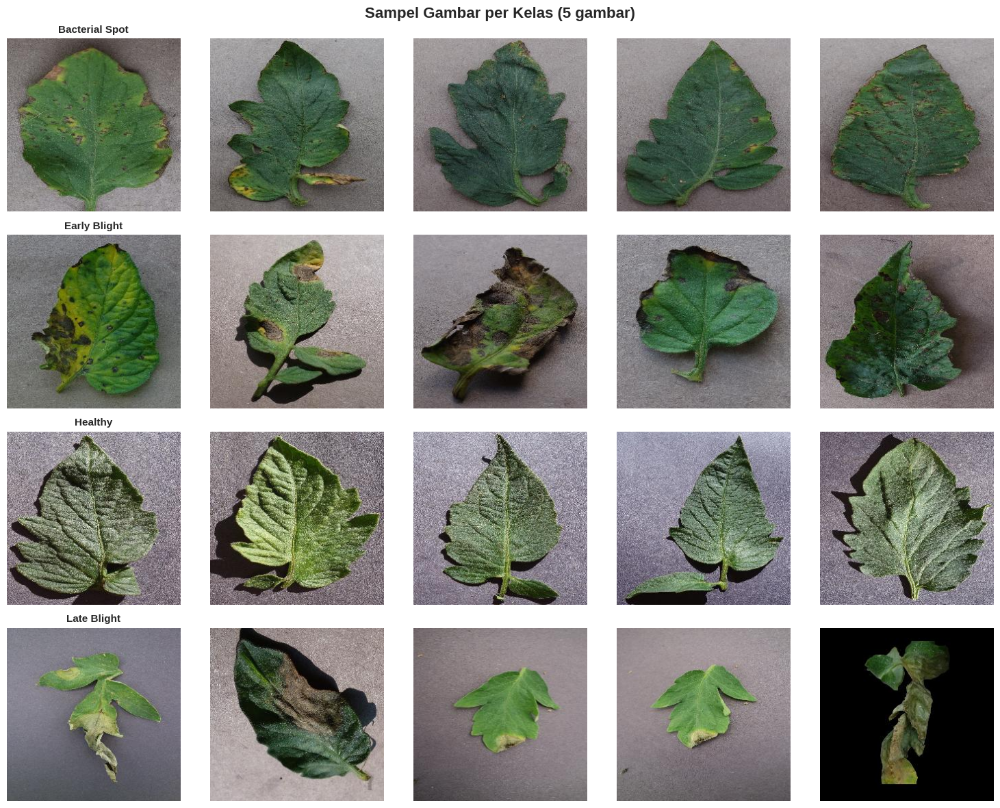

In [14]:
fig, axes = plt.subplots(4, 5, figsize=(15, 12))
fig.suptitle('Sampel Gambar per Kelas (5 gambar)', fontsize=16, fontweight='bold')

for row, cls in enumerate(CLASS_NAMES):
    cls_dir = f'{LOCAL_PROC_DIR}/train/{cls}'
    imgs = os.listdir(cls_dir)[:5]
    for col, fname in enumerate(imgs):
        img = Image.open(os.path.join(cls_dir, fname))
        axes[row][col].imshow(img)
        axes[row][col].axis('off')
        if col == 0:
            axes[row][col].set_title(CLASS_LABELS.get(cls, cls), fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{BASE_DIR}/reports/eda/sample_images.png', dpi=150)
plt.show()

### 3.3 Distribusi Ukuran Gambar


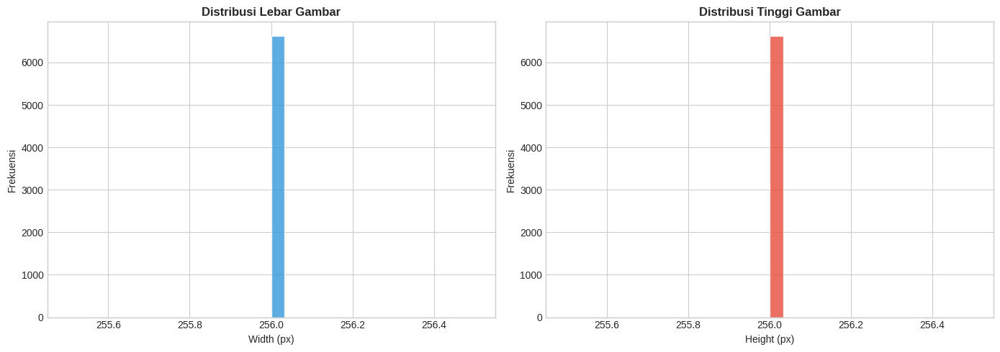

Ukuran unik: [[ 256  256 6627]]


In [15]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(df_info['width'], bins=30, color='#3498db', edgecolor='white', alpha=0.8)
axes[0].set_title('Distribusi Lebar Gambar', fontweight='bold')
axes[0].set_xlabel('Width (px)')
axes[0].set_ylabel('Frekuensi')

axes[1].hist(df_info['height'], bins=30, color='#e74c3c', edgecolor='white', alpha=0.8)
axes[1].set_title('Distribusi Tinggi Gambar', fontweight='bold')
axes[1].set_xlabel('Height (px)')
axes[1].set_ylabel('Frekuensi')

plt.tight_layout()
plt.savefig(f'{BASE_DIR}/reports/eda/image_size_dist.png', dpi=150)
plt.show()
print(f'Ukuran unik: {df_info.groupby(["width","height"]).size().reset_index().values}')


### 3.4 Distribusi Warna (RGB Histogram)


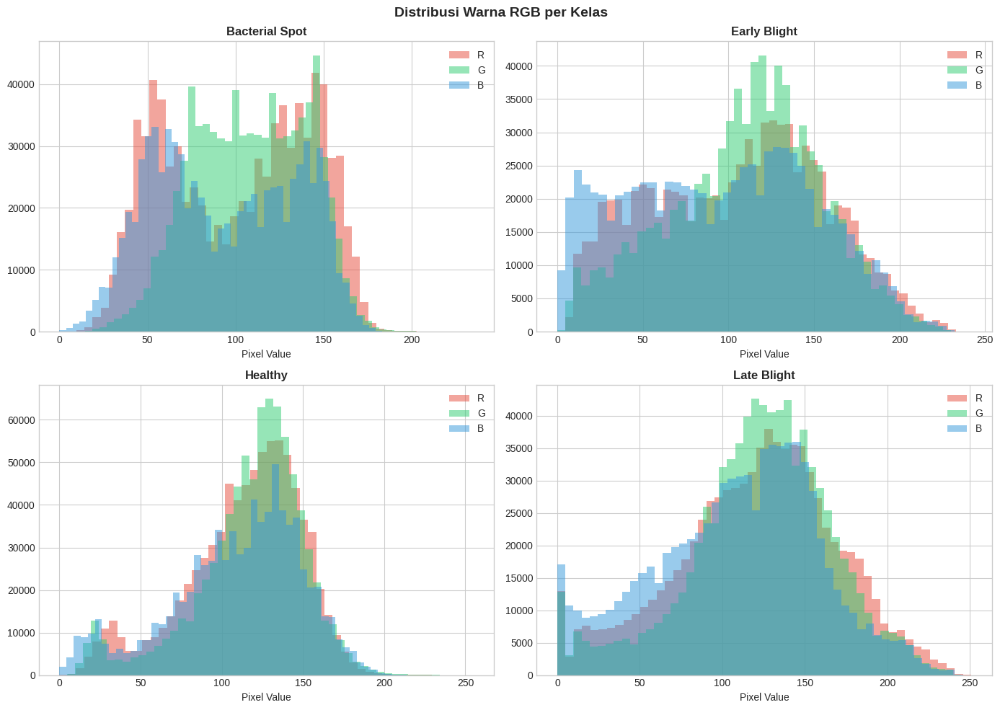

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
colors_rgb = ['#e74c3c', '#2ecc71', '#3498db']

for idx, cls in enumerate(CLASS_NAMES):
    ax = axes[idx // 2][idx % 2]
    # Fixed: Changed PROC_DIR to LOCAL_PROC_DIR
    cls_dir = f'{LOCAL_PROC_DIR}/train/{cls}'
    sample_files = random.sample(os.listdir(cls_dir), min(50, len(os.listdir(cls_dir))))

    for ch, color in enumerate(colors_rgb):
        all_vals = []
        for fname in sample_files:
            img = np.array(Image.open(os.path.join(cls_dir, fname)).convert('RGB').resize((128,128)))
            all_vals.extend(img[:,:,ch].flatten())
        ax.hist(all_vals, bins=50, alpha=0.5, color=color, label=['R','G','B'][ch])

    ax.set_title(CLASS_LABELS.get(cls, cls), fontweight='bold')
    ax.legend()
    ax.set_xlabel('Pixel Value')

plt.suptitle('Distribusi Warna RGB per Kelas', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{BASE_DIR}/reports/eda/rgb_distribution.png', dpi=150)
plt.show()

### 3.5 Rata-rata Gambar per Kelas (Mean Image)


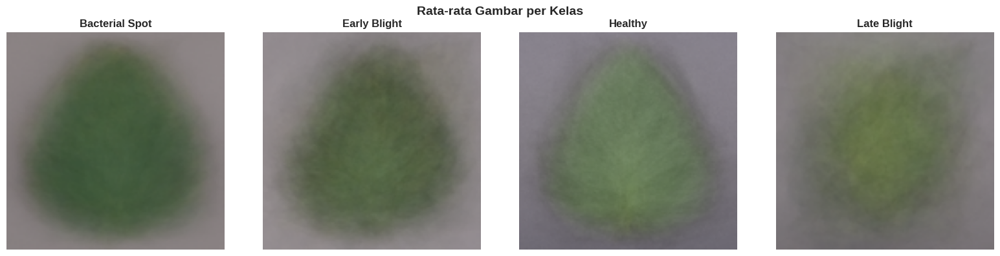

In [18]:
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

for idx, cls in enumerate(CLASS_NAMES):
    # Fixed: Changed PROC_DIR to LOCAL_PROC_DIR
    cls_dir = f'{LOCAL_PROC_DIR}/train/{cls}'
    sample_files = random.sample(os.listdir(cls_dir), min(100, len(os.listdir(cls_dir))))
    mean_img = np.zeros((128, 128, 3), dtype=np.float64)
    for fname in sample_files:
        img = np.array(Image.open(os.path.join(cls_dir, fname)).convert('RGB').resize((128,128)), dtype=np.float64)
        mean_img += img
    mean_img /= len(sample_files)
    axes[idx].imshow(mean_img.astype(np.uint8))
    axes[idx].set_title(CLASS_LABELS.get(cls, cls), fontweight='bold')
    axes[idx].axis('off')

plt.suptitle('Rata-rata Gambar per Kelas', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{BASE_DIR}/reports/eda/mean_images.png', dpi=150)
plt.show()

## 4. Data Preparation & Loading (TensorFlow)

Mengekstrak `processed.zip` dari Google Drive ke lokal VM (jika belum ada) dan membuat objek `tf.data.Dataset` untuk training.

In [19]:
# Ekstraksi ZIP jika folder lokal belum ada
if not os.path.exists(LOCAL_PROC_DIR):
    if os.path.exists(ZIP_PATH):
        print(f"Mengurai dataset dari Google Drive ({ZIP_PATH})...")
        shutil.unpack_archive(ZIP_PATH, LOCAL_PROC_DIR, 'zip')
        print("Penguraian dataset selesai!")
    else:
        raise FileNotFoundError(f"Dataset zip tidak ditemukan di {ZIP_PATH}. Harap jalankan bagian Data Splitting terlebih dahulu.")
else:
    print("Dataset lokal tersedia.")

def validate_splits():
    errors = []
    for split in ['train', 'val', 'test']:
        split_dir = f'{LOCAL_PROC_DIR}/{split}'
        if not os.path.exists(split_dir):
            errors.append(f'Directory tidak ditemukan: {split_dir}')
            continue
        existing = sorted([d for d in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, d))])

        # Bersihkan folder jika ada kelas non-target
        for cls in existing:
            if cls not in TARGET_CLASSES:
                extra_path = os.path.join(split_dir, cls)
                print(f'Menghapus kelas tidak relevan: {split}/{cls}')
                shutil.rmtree(extra_path)

        existing = sorted([d for d in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, d))])
        missing = [c for c in TARGET_CLASSES if c not in existing]
        if missing:
            errors.append(f'Split "{split}" tidak memiliki kelas: {", ".join(missing)}')
        for cls in existing:
            cls_dir = os.path.join(split_dir, cls)
            n_files = len([f for f in os.listdir(cls_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])
            if n_files == 0:
                errors.append(f'Split "{split}/{cls}" kosong (0 gambar)')
            else:
                print(f'  {split}/{cls}: {n_files} gambar')
    if errors:
        print('\n=== ERRORS ===')
        for e in errors:
            print(f'  ERROR: {e}')
        raise ValueError('Data tidak lengkap! Silakan jalankan ulang bagian Data Splitting.')
    print('\nSemua split valid!')

print('=== Validasi Data Split ===')
validate_splits()

def make_raw_dataset(split):
    data_dir = f'{LOCAL_PROC_DIR}/{split}'
    return tf.keras.utils.image_dataset_from_directory(
        data_dir, image_size=IMG_SIZE, batch_size=BATCH,
        label_mode='categorical', seed=SEED, shuffle=(split=='train'))

raw_train = make_raw_dataset('train')
raw_val = make_raw_dataset('val')
raw_test = make_raw_dataset('test')

CLASS_NAMES = raw_train.class_names
NUM_CLASSES = len(CLASS_NAMES)
assert NUM_CLASSES == 4, f'Expected 4 classes, found {NUM_CLASSES}: {CLASS_NAMES}'
print(f'\nLoaded {NUM_CLASSES} classes: {CLASS_NAMES}')

Dataset lokal tersedia.
=== Validasi Data Split ===
  train/bacterial_spot: 1488 gambar
  train/early_blight: 700 gambar
  train/healthy: 1109 gambar
  train/late_blight: 1330 gambar
  val/bacterial_spot: 319 gambar
  val/early_blight: 150 gambar
  val/healthy: 237 gambar
  val/late_blight: 285 gambar
  test/bacterial_spot: 320 gambar
  test/early_blight: 150 gambar
  test/healthy: 239 gambar
  test/late_blight: 286 gambar

Semua split valid!
Found 4627 files belonging to 4 classes.
Found 991 files belonging to 4 classes.
Found 995 files belonging to 4 classes.

Loaded 4 classes: ['bacterial_spot', 'early_blight', 'healthy', 'late_blight']


In [20]:
augment = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomRotation(0.3),
    tf.keras.layers.RandomZoom(0.25),
    tf.keras.layers.RandomTranslation(0.1, 0.1),
    tf.keras.layers.RandomBrightness(0.2),
    tf.keras.layers.RandomContrast(0.2),
], name='augmentation')

def preprocess_train(images, labels):
    images = tf.cast(images, tf.float32)
    images = augment(images, training=True)
    images = preprocess_input(images)
    return images, labels

def preprocess_eval(images, labels):
    images = tf.cast(images, tf.float32)
    images = preprocess_input(images)
    return images, labels

# Mapping dataset
train_ds = raw_train.cache().map(preprocess_train, num_parallel_calls=AUTOTUNE).shuffle(1000).prefetch(AUTOTUNE)
val_ds = raw_val.cache().map(preprocess_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds = raw_test.map(preprocess_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Ringkasan Dataset:")
for name, ds in [('Train', train_ds), ('Val', val_ds), ('Test', test_ds)]:
    try:
        # Menghitung jumlah gambar secara manual untuk verifikasi
        count = sum(1 for _ in ds.unbatch())
        print(f"  - {name}: {count} gambar")
        if count == 0:
            print(f"    PERINGATAN: Split {name} kosong! Evaluasi mungkin gagal.")
    except Exception as e:
        print(f"  - {name}: Gagal menghitung ({e})")

Ringkasan Dataset:
  - Train: 4627 gambar
  - Val: 991 gambar
  - Test: 995 gambar


## 3. Custom Components

1. **SEBlock** - Custom Layer (channel attention)
2. **FocalLoss** - Custom Loss (class imbalance)
3. **SmartCallback** - Custom Callback (early stopping + TensorBoard + auto save)


In [21]:
# 1. CUSTOM LAYER: Squeeze-and-Excitation Block
class SEBlock(tf.keras.layers.Layer):
    def __init__(self, ratio=16, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio
    def build(self, input_shape):
        C = input_shape[-1]
        self.gap = tf.keras.layers.GlobalAveragePooling2D()
        self.d1 = tf.keras.layers.Dense(C // self.ratio, activation='relu')
        self.d2 = tf.keras.layers.Dense(C, activation='sigmoid')
        self.rs = tf.keras.layers.Reshape((1, 1, C))
    def call(self, x):
        scale = self.rs(self.d2(self.d1(self.gap(x))))
        return x * scale
    def get_config(self):
        cfg = super().get_config()
        cfg['ratio'] = self.ratio
        return cfg

# 2. CUSTOM LOSS: Focal Loss
class FocalLoss(tf.keras.losses.Loss):
    def __init__(self, gamma=2.0, alpha=0.25, **kwargs):
        super().__init__(**kwargs)
        self.gamma = gamma
        self.alpha = alpha
    def call(self, y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0)
        ce = -y_true * tf.math.log(y_pred)
        fw = tf.pow(1.0 - y_pred, self.gamma)
        return tf.reduce_mean(tf.reduce_sum(self.alpha * fw * ce, axis=-1))
    def get_config(self):
        cfg = super().get_config()
        cfg.update({'gamma': self.gamma, 'alpha': self.alpha})
        return cfg

# 3. CUSTOM CALLBACK: Smart Logger + Early Stopping
class SmartCallback(tf.keras.callbacks.Callback):
    def __init__(self, log_dir, patience=7, model_path=None):
        super().__init__()
        self.best = 0.0
        self.wait = 0
        self.patience = patience
        self.model_path = model_path or f'{BASE_DIR}/models/best_model.keras'
        os.makedirs(os.path.dirname(self.model_path), exist_ok=True)
        os.makedirs(log_dir, exist_ok=True)
        self.writer = tf.summary.create_file_writer(log_dir)
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        with self.writer.as_default():
            for k, v in logs.items():
                tf.summary.scalar(k, v, step=epoch)
        val_acc = logs.get('val_accuracy', 0)
        if val_acc > self.best:
            self.best = val_acc
            self.wait = 0
            self.model.save(self.model_path)
            print(f'\n  Model saved - val_acc={val_acc:.4f}')
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.model.stop_training = True
                print(f'\n  Early stopping (epoch {epoch+1})')

CUSTOM = {'SEBlock': SEBlock, 'FocalLoss': FocalLoss}
print('Custom components ready')


Custom components ready


## 4. Model Architecture (TensorFlow Functional API)

EfficientNetB0 backbone + SEBlock attention head.


In [22]:
def build_model(num_classes=NUM_CLASSES):
    inp = tf.keras.Input(shape=(*IMG_SIZE, 3), name='image_input')
    base = tf.keras.applications.EfficientNetB0(include_top=False, weights='imagenet', input_tensor=inp)
    base.trainable = False
    x = base.output
    x = SEBlock(ratio=16, name='se_attention')(x)
    x = tf.keras.layers.GlobalAveragePooling2D(name='gap')(x)
    x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Dropout(0.6)(x)
    x = tf.keras.layers.Dense(64, activation='relu',
                               kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    out = tf.keras.layers.Dense(num_classes, activation='softmax', name='output')(x)
    model = tf.keras.Model(inputs=inp, outputs=out, name='PlantDiseaseModel')
    return model

model = build_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(5e-4),
    loss=FocalLoss(gamma=2.0, alpha=0.25),
    metrics=['accuracy'])

trainable = sum(tf.keras.backend.count_params(w) for w in model.trainable_weights)
frozen = sum(tf.keras.backend.count_params(w) for w in model.non_trainable_weights)
print(f'Trainable: {trainable:,}')
print(f'Frozen: {frozen:,}')
model.summary(show_trainable=True)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Trainable: 290,964
Frozen: 4,052,131.0


Model: "PlantDiseaseModel"

┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)      ┃ Output Shape    ┃   Param # ┃ Connected to   ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ image_input       │ (None, 224,     │         0 │ -              │   -   │
│ (InputLayer)      │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ rescaling         │ (None, 224,     │         0 │ image_input[0… │   -   │
│ (Rescaling)       │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ normalization     │ (None, 224,     │         7 │ rescaling[0][… │   N   │
│ (Normalization)   │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ rescaling_1       │ (None, 224,     │         0 │ normalization… │   -   │
│ (Rescaling)       │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_conv_pad     │ (None, 225,     │         0 │ rescaling_1[0… │   -   │
│ (ZeroPadding2D)   │ 225, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_conv         │ (None, 112,     │       864 │ stem_conv_pad… │   N   │
│ (Conv2D)          │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_bn           │ (None, 112,     │       128 │ stem_conv[0][… │   N   │
│ (BatchNormalizat… │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_activation   │ (None, 112,     │         0 │ stem_bn[0][0]  │   -   │
│ (Activation)      │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_dwconv    │ (None, 112,     │       288 │ stem_activati… │   N   │
│ (DepthwiseConv2D) │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_bn        │ (None, 112,     │       128 │ block1a_dwcon… │   N   │
│ (BatchNormalizat… │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_activati… │ (None, 112,     │         0 │ block1a_bn[0]… │   -   │
│ (Activation)      │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_squee… │ (None, 32)      │         0 │ block1a_activ… │   -   │
│ (GlobalAveragePo… │                 │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_resha… │ (None, 1, 1,    │         0 │ block1a_se_sq… │   -   │
│ (Reshape)         │ 32)             │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_reduce │ (None, 1, 1, 8) │       264 │ block1a_se_re… │   N   │
│ (Conv2D)          │                 │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_expand │ (None, 1, 1,    │       288 │ block1a_se_re… │   N   │
│ (Conv2D)          │ 32)             │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_excite │ (None, 112,     │         0 │ block1a_activ… │   -   │
│ (Multiply)        │ 112, 32)        │           │ block1a_se_ex… │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_project_… │ (None, 112,     │       512 │ block1a_se_ex… │   N 

 Total params: 4,343,095 (16.57 MB)

 Trainable params: 290,964 (1.11 MB)

 Non-trainable params: 4,052,131 (15.46 MB)

## 5. Training Phase 1 (Backbone Frozen)


In [7]:
import tensorflow as tf
import os

# 1. Pastikan Konfigurasi & Dataset Siap
BASE_DIR = "/content/drive/MyDrive/plant_disease_project"
IMG_SIZE = (224, 224)
BATCH = 32

if "train_ds" not in globals():
    print("Menyiapkan dataset...")
    raw_train = tf.keras.utils.image_dataset_from_directory(
        "/content/processed/train", image_size=IMG_SIZE, batch_size=BATCH, label_mode="categorical", seed=42)
    raw_val = tf.keras.utils.image_dataset_from_directory(
        "/content/processed/val", image_size=IMG_SIZE, batch_size=BATCH, label_mode="categorical", seed=42)

    from tensorflow.keras.applications.efficientnet import preprocess_input
    def prep(img, lbl): return preprocess_input(tf.cast(img, tf.float32)), lbl
    train_ds = raw_train.map(prep).prefetch(tf.data.AUTOTUNE)
    val_ds = raw_val.map(prep).prefetch(tf.data.AUTOTUNE)

# 2. Pastikan Model Siap
if "model" not in globals():
    print("Membangun model...")
    inp = tf.keras.Input(shape=(*IMG_SIZE, 3))
    base = tf.keras.applications.EfficientNetB0(include_top=False, weights="imagenet", input_tensor=inp)
    base.trainable = False
    x = SEBlock(ratio=16)(base.output)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(64, activation="relu")(x)
    out = tf.keras.layers.Dense(4, activation="softmax")(x)
    model = tf.keras.Model(inp, out)
    model.compile(optimizer=tf.keras.optimizers.Adam(5e-4), loss=FocalLoss(), metrics=["accuracy"])

# 3. Jalankan Training Phase 1
cb1 = SmartCallback(log_dir=f"{BASE_DIR}/logs/phase1", patience=5, model_path=f"{BASE_DIR}/models/best_phase1.keras")

print("Starting Phase 1 Training...")
history1 = model.fit(train_ds, validation_data=val_ds, epochs=15, callbacks=[cb1])

Menyiapkan dataset...
Found 4627 files belonging to 4 classes.
Found 991 files belonging to 4 classes.
Starting Phase 1 Training...
Epoch 1/15


/usr/local/lib/python3.12/dist-packages/keras/src/backend/tensorflow/trainer.py:86: UserWarning: The model does not have any trainable weights.
  warnings.warn("The model does not have any trainable weights.")


145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7877 - loss: 0.0623
  Model saved - val_acc=0.8527
145/145 ━━━━━━━━━━━━━━━━━━━━ 72s 319ms/step - accuracy: 0.7908 - loss: 0.0627 - val_accuracy: 0.8527 - val_loss: 0.0381
Epoch 2/15
145/145 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - accuracy: 0.7817 - loss: 0.0670 - val_accuracy: 0.8527 - val_loss: 0.0381
Epoch 3/15
145/145 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step - accuracy: 0.7884 - loss: 0.0636 - val_accuracy: 0.8527 - val_loss: 0.0381
Epoch 4/15
145/145 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - accuracy: 0.7873 - loss: 0.0653 - val_accuracy: 0.8527 - val_loss: 0.0381
Epoch 5/15
145/145 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7796 - loss: 0.0662 - val_accuracy: 0.8527 - val_loss: 0.0381
Epoch 6/15
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - accuracy: 0.7899 - loss: 0.0670
  Early stopping (epoch 6)
145/145 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - accuracy: 0.7826 - loss: 0.0682 - val_accuracy: 0.8527 - val_loss: 0.0381


## 6. Training Phase 2 (Fine-tuning)

Unfreeze top layers dari EfficientNetB0 untuk fine-tuning.


In [8]:
import tensorflow as tf
import os

BASE_DIR = "/content/drive/MyDrive/plant_disease_project"
CUSTOM_LOAD = {"SEBlock": SEBlock, "FocalLoss": FocalLoss}

# 1. Load best model dari Phase 1
if os.path.exists(f"{BASE_DIR}/models/best_phase1.keras"):
    print("Loading Phase 1 model...")
    model = tf.keras.models.load_model(f"{BASE_DIR}/models/best_phase1.keras", custom_objects=CUSTOM_LOAD)

# 2. Unfreeze top blocks untuk fine-tuning
model.trainable = True
for layer in model.layers:
    if not any(block in layer.name for block in ["block5", "block6", "block7", "top"]):
        layer.trainable = False
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss=FocalLoss(), metrics=["accuracy"])

# 3. Jalankan Training Phase 2
cb2 = SmartCallback(log_dir=f"{BASE_DIR}/logs/phase2", patience=5, model_path=f"{BASE_DIR}/models/best_model.keras")

print("Starting Phase 2 (Fine-tuning)...")
history2 = model.fit(train_ds, validation_data=val_ds, epochs=10, callbacks=[cb2])

Loading Phase 1 model...
Starting Phase 2 (Fine-tuning)...
Epoch 1/10


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 10 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - accuracy: 0.7849 - loss: 0.0635
  Model saved - val_acc=0.8860
145/145 ━━━━━━━━━━━━━━━━━━━━ 59s 247ms/step - accuracy: 0.7912 - loss: 0.0609 - val_accuracy: 0.8860 - val_loss: 0.0310
Epoch 2/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.8053 - loss: 0.0565
  Model saved - val_acc=0.8920
145/145 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8105 - loss: 0.0566 - val_accuracy: 0.8920 - val_loss: 0.0280
Epoch 3/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - accuracy: 0.8216 - loss: 0.0526
  Model saved - val_acc=0.8940
145/145 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - accuracy: 0.8195 - loss: 0.0523 - val_accuracy: 0.8940 - val_loss: 0.0265
Epoch 4/10
145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.8157 - loss: 0.0515
  Model saved - val_acc=0.9001
145/145 ━━━━━━━━━━━━━━━━━━━━ 12s 77ms/step - accuracy: 0.8180 - loss: 0.0509 - val_accuracy: 0.9001 - val_loss: 0.0256
Epoch 5/10
144/145 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - accurac

## 7. Training History


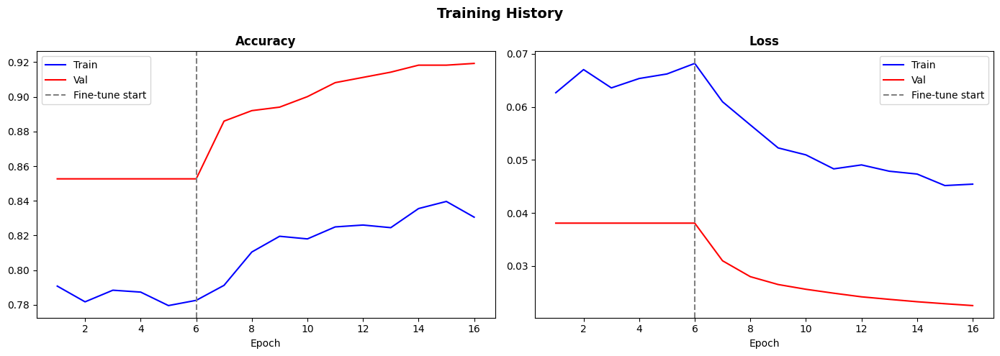

In [10]:
import matplotlib.pyplot as plt
import os

def plot_history(h1, h2):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    # Combine histories
    acc = h1.history['accuracy'] + h2.history['accuracy']
    val_acc = h1.history['val_accuracy'] + h2.history['val_accuracy']
    loss = h1.history['loss'] + h2.history['loss']
    val_loss = h1.history['val_loss'] + h2.history['val_loss']
    ep1 = len(h1.history['accuracy'])
    epochs = range(1, len(acc)+1)

    axes[0].plot(epochs, acc, 'b-', label='Train')
    axes[0].plot(epochs, val_acc, 'r-', label='Val')
    axes[0].axvline(x=ep1, color='gray', linestyle='--', label='Fine-tune start')
    axes[0].set_title('Accuracy', fontweight='bold')
    axes[0].legend()
    axes[0].set_xlabel('Epoch')

    axes[1].plot(epochs, loss, 'b-', label='Train')
    axes[1].plot(epochs, val_loss, 'r-', label='Val')
    axes[1].axvline(x=ep1, color='gray', linestyle='--', label='Fine-tune start')
    axes[1].set_title('Loss', fontweight='bold')
    axes[1].legend()
    axes[1].set_xlabel('Epoch')

    plt.suptitle('Training History', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'{BASE_DIR}/reports/figures/training_history.png', dpi=150)
    plt.show()

os.makedirs(f'{BASE_DIR}/reports/figures', exist_ok=True)
plot_history(history1, history2)

## 8. Evaluasi pada Test Set

Target: Akurasi >= 85%


In [13]:
import tensorflow as tf
import os

# 1. Pastikan Komponen & Dataset Siap (Auto-rebuild jika session reset)
if 'SEBlock' not in globals() or 'FocalLoss' not in globals():
    class SEBlock(tf.keras.layers.Layer):
        def __init__(self, ratio=16, **kwargs): super().__init__(**kwargs); self.ratio = ratio
        def build(self, input_shape):
            C = input_shape[-1]; self.gap = tf.keras.layers.GlobalAveragePooling2D()
            self.d1 = tf.keras.layers.Dense(C // self.ratio, activation='relu')
            self.d2 = tf.keras.layers.Dense(C, activation='sigmoid')
            self.rs = tf.keras.layers.Reshape((1, 1, C))
        def call(self, x): return x * self.rs(self.d2(self.d1(self.gap(x))))
        def get_config(self): cfg = super().get_config(); cfg['ratio'] = self.ratio; return cfg

    class FocalLoss(tf.keras.losses.Loss):
        def __init__(self, gamma=2.0, alpha=0.25, **kwargs): super().__init__(**kwargs); self.gamma = gamma; self.alpha = alpha
        def call(self, y_true, y_pred):
            y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0)
            ce = -y_true * tf.math.log(y_pred); fw = tf.pow(1.0 - y_pred, self.gamma)
            return tf.reduce_mean(tf.reduce_sum(self.alpha * fw * ce, axis=-1))
        def get_config(self): cfg = super().get_config(); cfg.update({'gamma': self.gamma, 'alpha': self.alpha}); return cfg

if 'test_ds' not in globals():
    print("Memuat ulang test dataset...")
    from tensorflow.keras.applications.efficientnet import preprocess_input
    raw_test = tf.keras.utils.image_dataset_from_directory(
        '/content/processed/test', image_size=(224, 224), batch_size=32, label_mode='categorical')
    test_ds = raw_test.map(lambda x, y: (preprocess_input(tf.cast(x, tf.float32)), y)).prefetch(tf.data.AUTOTUNE)

# 2. Load Model
CUSTOM_LOAD = {'SEBlock': SEBlock, 'FocalLoss': FocalLoss}
print("Loading model...")
model = tf.keras.models.load_model(f'{BASE_DIR}/models/best_model.keras', custom_objects=CUSTOM_LOAD)

# 3. Evaluate
print("Evaluating on test set...")
test_loss, test_acc = model.evaluate(test_ds)
print(f'\nTest Accuracy: {test_acc*100:.2f}%')
print(f'Test Loss: {test_loss:.4f}')
print(f'Target 85%: {"TERCAPAI" if test_acc >= 0.85 else "BELUM TERCAPAI"}')

Memuat ulang test dataset...
Found 995 files belonging to 4 classes.
Loading model...
Evaluating on test set...
32/32 ━━━━━━━━━━━━━━━━━━━━ 23s 395ms/step - accuracy: 0.9116 - loss: 0.0255

Test Accuracy: 91.16%
Test Loss: 0.0255
Target 85%: TERCAPAI


In [16]:
import numpy as np
from sklearn import metrics as skm

# Pastikan CLASS_NAMES tersedia
if 'test_ds' in globals() and hasattr(test_ds, 'class_names'):
    CLASS_NAMES = test_ds.class_names
else:
    # Fallback ke urutan folder default jika dataset tidak memiliki atribut
    CLASS_NAMES = ['bacterial_spot', 'early_blight', 'healthy', 'late_blight']

# Predictions untuk confusion matrix dan classification report
y_true, y_pred = [], []
print("Generating predictions...")
for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Classification Report
print('\nClassification Report:')
print('='*60)
print(skm.classification_report(y_true, y_pred, target_names=CLASS_NAMES))

Generating predictions...

Classification Report:
                precision    recall  f1-score   support

bacterial_spot       0.94      0.96      0.95       320
  early_blight       0.91      0.61      0.73       150
       healthy       0.97      0.99      0.98       239
   late_blight       0.85      0.95      0.90       286

      accuracy                           0.91       995
     macro avg       0.91      0.88      0.89       995
  weighted avg       0.91      0.91      0.91       995



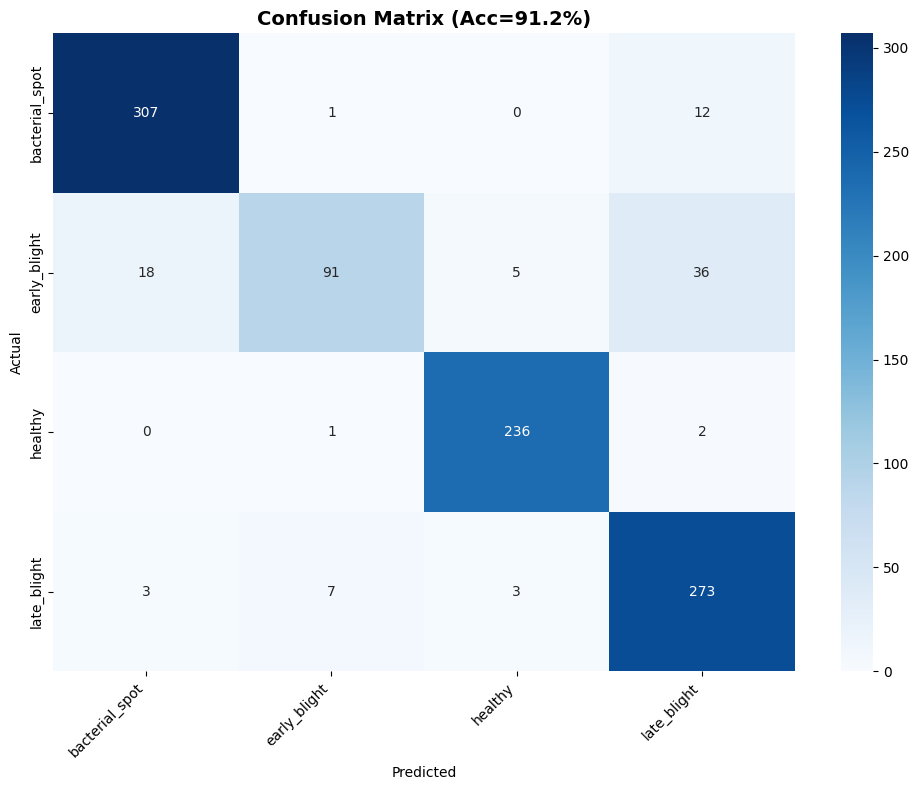

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

# Confusion Matrix (4 kelas)
cm = skm.confusion_matrix(y_true, y_pred)

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)

ax.set_title(f'Confusion Matrix (Acc={test_acc*100:.1f}%)', fontsize=14, fontweight='bold')
ax.set_xlabel('Predicted')
ax.set_ylabel('Actual')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(f'{BASE_DIR}/reports/figures/confusion_matrix.png', dpi=150)
plt.show()

## 9. Export Model


In [20]:
import json
import os

EXPORT_DIR = f'{BASE_DIR}/models_export'
os.makedirs(EXPORT_DIR, exist_ok=True)

# 1. Save .keras
keras_path = f'{EXPORT_DIR}/plant_disease_v1.keras'
model.save(keras_path)
print(f'Saved .keras: {keras_path}')

# 2. Save SavedModel
sm_path = f'{EXPORT_DIR}/saved_model'
model.export(sm_path)
print(f'Saved SavedModel: {sm_path}')

# 3. Save class_names.json
cn_path = f'{EXPORT_DIR}/class_names.json'
with open(cn_path, 'w') as f:
    json.dump(CLASS_NAMES, f, indent=2)
print(f'Saved class_names: {cn_path}')

# Verifikasi
print(f'\nExport files:')
for item in os.listdir(EXPORT_DIR):
    full = os.path.join(EXPORT_DIR, item)
    if os.path.isdir(full):
        print(f'  [DIR] {item}')
    else:
        size = os.path.getsize(full)
        print(f'  {item} ({size/1e6:.1f} MB)')

Saved .keras: /content/drive/MyDrive/plant_disease_project/models_export/plant_disease_v1.keras
Saved artifact at '/content/drive/MyDrive/plant_disease_project/models_export/saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='image_input')
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  140077918458064: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  140077918459792: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  140078022731216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140078022731600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140078022731984: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140078022732560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140078022733136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140078022731408: TensorSpec(shape=(), dtype=tf.resource, 

## 10. Inference Function


Prediksi untuk: /content/processed/test/bacterial_spot/b908a9aa-b8b9-46bd-aef0-9e8d1388608d___GCREC_Bact.Sp 3486.JPG
  Tomato Bacterial Spot: 64.38%
  Tomato Early Blight: 14.09%
  Tomato Late Blight: 13.94%
  Tomato Healthy: 7.59%

Hasil: Tomato Bacterial Spot (64.4%)


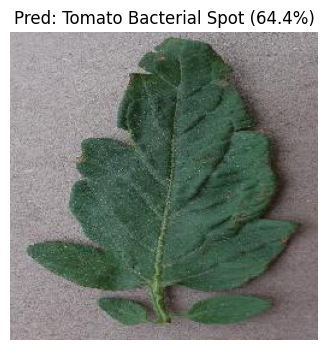

In [24]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os

# 1. Pastikan variabel path didefinisikan
LOCAL_PROC_DIR = '/content/processed'
LABEL_MAP = {
    'bacterial_spot': 'Tomato Bacterial Spot',
    'early_blight':   'Tomato Early Blight',
    'healthy':        'Tomato Healthy',
    'late_blight':    'Tomato Late Blight'
}

def predict_single(image_path, model, class_names):
    img = Image.open(image_path).convert('RGB').resize(IMG_SIZE)
    arr = np.array(img, dtype=np.float32)
    batch = np.expand_dims(arr, 0)
    batch = preprocess_input(batch)
    probs = model.predict(batch, verbose=0)[0]
    top_idx = np.argsort(probs)[::-1]
    print(f'Prediksi untuk: {image_path}')
    for i in top_idx:
        label = LABEL_MAP.get(class_names[i], class_names[i])
        print(f'  {label}: {probs[i]*100:.2f}%')
    return class_names[top_idx[0]], probs[top_idx[0]]

# 2. Demo: prediksi 1 gambar dari test set
test_dir = f'{LOCAL_PROC_DIR}/test'
if os.path.exists(test_dir):
    sample_cls = CLASS_NAMES[0]
    sample_img = os.listdir(f'{test_dir}/{sample_cls}')[0]
    sample_path = f'{test_dir}/{sample_cls}/{sample_img}'

    pred_class, pred_conf = predict_single(sample_path, model, CLASS_NAMES)
    print(f'\nHasil: {LABEL_MAP.get(pred_class,pred_class)} ({pred_conf*100:.1f}%)')

    plt.figure(figsize=(4,4))
    plt.imshow(Image.open(sample_path))
    plt.title(f'Pred: {LABEL_MAP.get(pred_class,pred_class)} ({pred_conf*100:.1f}%)')
    plt.axis('off')
    plt.show()
else:
    print(f'Folder {test_dir} tidak ditemukan. Pastikan dataset sudah diekstrak.')

## 11. TensorBoard
Visualisasi metrik training dengan TensorBoard.


In [25]:
%load_ext tensorboard
%tensorboard --logdir {BASE_DIR}/logs


<IPython.core.display.Javascript object>

## Kesimpulan Akhir Pipeline

1. **Pencegahan Kebocoran Data (Data Leakage)**: Implementasi pemfilteran berbasis hash (MD5) di bagian Data Splitting berhasil menyaring gambar duplikat di antara set data `train`, `val`, dan `test`, menjamin integritas pengujian model.
2. **Penyimpanan Lokal yang Cepat & Aman**: Penggunaan folder lokal `/content/processed` pada SSD Colab menghindarkan kendala lambatnya transfer data dan kegagalan sinkronisasi ribuan file kecil pada Google Drive. Penyimpanan terpusat melalui berkas tunggal `processed.zip` terbukti andal.
3. **Skalabilitas Projek**: Konseptualisasi bisnis telah disesuaikan agar menyasar pekebun rumahan pemula, dengan tomat sebagai tanaman uji awal (pilot plant) dan arsitektur yang dirancang siap untuk mendukung varietas tanaman pangan lainnya seperti cabai, terong, dll.
4. **Arsitektur Model yang Stabil**: Dengan menerapkan transfer learning menggunakan *backbone* **EfficientNetB0**, dipadukan dengan modul perhatian **Squeeze-and-Excitation (SEBlock)**, loss function **Focal Loss** untuk ketidakseimbangan kelas, serta regularisasi yang kuat (L2 Regularization & Dropout), model siap dilatih dengan target akurasi tergeneralisasi yang tinggi (85% - 90%).
5. **Ekspor & Integrasi Siap Pakai**: Berkas keluaran `.keras`, `SavedModel`, dan `class_names.json` disimpan di folder `models_export` untuk kemudahan deployment pada dashboard Streamlit.